# All methods

In [ ]:
import numpy as np
import cv2
import skimage
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

# Taking a matrix of size 5 as the kernel
kernel = np.ones((5, 5), np.uint8)

def show_image(name, img):
    cv2_imshow(img)

def plt_show_img(img, title, im_cmap='gray'):
    plt.imshow(img, cmap=im_cmap), plt.title(title)
    plt.xticks([]), plt.yticks([])

def orb_detector(query_img, train_img):
    # Convert it to grayscale
    query_img_bw = cv2.cvtColor(query_img, cv2.COLOR_BGR2GRAY)
    train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)

    orb = cv2.ORB_create()
    queryKeypoints, queryDescriptors = orb.detectAndCompute(query_img_bw, None)
    trainKeypoints, trainDescriptors = orb.detectAndCompute(train_img_bw, None)

    matcher = cv2.BFMatcher()
    matches = matcher.match(queryDescriptors, trainDescriptors)

    final_img = cv2.drawMatches(query_img, queryKeypoints,
                                train_img, trainKeypoints, matches[:20], None)

    final_img = cv2.resize(final_img, (1000, 650))

    cv2.imwrite('orb_image.jpg', final_img)

    # Show the final image
    show_image("Orb matches", final_img)

def sift(image):
    img = image.copy()
    # Converting image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Applying SIFT detector
    sift = cv2.SIFT_create()
    kp = sift.detect(gray, None)

    # Marking the keypoint on the image using circles
    img = cv2.drawKeypoints(gray,
                            kp,
                            img,
                            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    show_image("Sift detector", img)
    cv2.imwrite('sift_image.jpg', img)

def grayscale(img):
    res_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    cv2.imwrite('grayscale_image.jpg', res_img)

    show_image("Grayscale", res_img)

def hsv(img):
    res_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    cv2.imwrite('hsv_image.jpg', res_img)

    show_image("HSV", res_img)

def flip_horizontally(img):
    res_img = cv2.flip(img, 1)
    cv2.imwrite('flip_horizontally_image.jpg', res_img)
    show_image("Flip horizontally", res_img)

def flip_vertically(img):
    res_img = cv2.flip(img, 0)
    cv2.imwrite('flip_vertically_image.jpg', res_img)

    show_image("Flip vertically", res_img)

def rotate_45(img):
    height, width = img.shape[:2]
    center = (width / 2, height / 2)
    rotate_matrix = cv2.getRotationMatrix2D(center=center, angle=45, scale=1)
    res_img = cv2.warpAffine(src=img, M=rotate_matrix, dsize=(width, height))
    cv2.imwrite('rotate45.jpg', res_img)

    show_image("Rotate by 45 degrees", res_img)

def rotate_30(img, point):
    center = (point[0] / 2, point[1] / 2)
    rotate_matrix = cv2.getRotationMatrix2D(center=center, angle=30, scale=1)
    res_img = cv2.warpAffine(src=img, M=rotate_matrix, dsize=img.shape[1::-1], flags=cv2.INTER_LINEAR)
    cv2.imwrite('rotate30.jpg', res_img)
    show_image("Rotate by 30 degrees", res_img)

def translate(img):
    num_rows, num_cols = img.shape[:2]
    translation_matrix = np.float32([[1, 0, 10], [0, 1, 0]])
    img_translation = cv2.warpAffine(img, translation_matrix, (num_cols, num_rows))
    show_image('Translation', img_translation)

def increase_brightness(img, value=50):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value
    final_hsv = cv2.merge((h, s, v))
    img_brightness = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    show_image('Brightness', img_brightness)

def adjust_contrast_brightness(img, contrast:float=1.0, brightness:int=0):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a, b = cv2.split(lab)

    # Applying CLAHE to L-channel
    # feel free to try different values for the limit and grid size:
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l_channel)

    # merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv2.merge((cl, a, b))

    # Converting image from LAB Color model to BGR color spcae
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

    # Stacking the original image with the enhanced image
    result = np.hstack((img, enhanced_img))
    show_image('Contrast', result)

def linear_stretching(input, lower_stretch_from, upper_stretch_from):
    lower_stretch_to = 0  # lower value of the range to stretch to - output
    upper_stretch_to = 255  # upper value of the range to stretch to - output

    output = (input - lower_stretch_from) * (
                (upper_stretch_to - lower_stretch_to) / (upper_stretch_from - lower_stretch_from)) + lower_stretch_to

    return output

def gamma_correction(img):
    # assign variable to max and min value of image pixels
    max_value = np.max(img)
    min_value = np.min(img)

    lower_stretch_to = 0  # lower value of the range to stretch to - output
    upper_stretch_to = 255  # upper value of the range to stretch to - output
    # enhanced_img = img
    # cycle to apply linear stretching formula on each pixel
    for y in range(len(img)):
        for x in range(len(img[y])):
            img[y][x] = linear_stretching(img[y][x], min_value, max_value)

    show_image('Gamma correction', img)

def hist_equalization(img):
    img_to_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    img_to_yuv[:, :, 0] = cv2.equalizeHist(img_to_yuv[:, :, 0])
    hist_equalization_result = cv2.cvtColor(img_to_yuv, cv2.COLOR_YUV2BGR)
    show_image('Histograms Equalization', hist_equalization_result)

def white_balance(img, percentile, name):
    level = percentile / 2
    enhanced_img = img.copy()

    for y in range(len(img)):
        for x in range(len(img[y])):
            pixel = enhanced_img[y][x]
            r = pixel[0 * 3 + 2] + level
            if r > 255:
                pixel[0 * 3 + 2] = 255
            elif r < 0:
                pixel[0 * 3 + 2] = 0
            else:
                pixel[0 * 3 + 2] = r

            g = pixel[0 * 3 + 1] + level
            if g > 255:
                pixel[0 * 3 + 1] = 255
            elif g < 0:
                pixel[0 * 3 + 1] = 0
            else:
                pixel[0 * 3 + 1] = g

            b = pixel[0 * 3] - level
            if b > 255:
                pixel[0 * 3] = 255
            elif b < 0:
                pixel[0 * 3] = 0
            else:
                pixel[0 * 3] = b

    result = np.hstack((img, enhanced_img))
    show_image('White balance: ' + name, result)

red = [0, 0, 255]
green = [0, 255, 0]
blue = [255, 0, 0]
white = [255, 255, 255]
black = [0, 0, 0]

def color_palette(image, old_color, new_color):
    height, width, channels = np.shape(image)
    mask = np.zeros((height, width))
    mask = [[1 if np.all(channels == [old_color]) else 0 for channels in row] for row in image]

    mask = np.array(mask)
    coords_x, coord_y = np.where(mask > 0)

    img_cp = image.copy()
    img_cp[coords_x, coord_y, :] = new_color

    show_image('Change all fragments of ' + str(old_color) + ' to ' + str(new_color), img_cp)

def binarize_image(img):
    th, im_th = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)

    show_image('Binarized image', im_th)

def binarize_contours(img):
    imgray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 150, 255, cv2.THRESH_BINARY)

    contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

    image_copy = imgray.copy()
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2,
                     lineType=cv2.LINE_AA)

    show_image('Binarized image: contours', image_copy)

def laplasian(img):
    ddepth = cv2.CV_16S
    kernel_size = 3

    src = cv2.GaussianBlur(img, (3, 3), 0)
    src_gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
    dst = cv2.Laplacian(src_gray, ddepth, ksize=kernel_size)
    abs_dst = cv2.convertScaleAbs(dst)
    show_image("Laplasian", abs_dst)

def smoothing_image(img):
    Gaussian = cv2.GaussianBlur(img, (7, 7), 0)
    show_image('Gaussian Blurring', Gaussian)

def fourier(image, mask_value):
    img = cv2.cvtColor(np.float32(image), cv2.COLOR_BGR2GRAY)
    img_float32 = np.float32(img)  # to float, convenient for DFT calculation
    dft = cv2.dft(img_float32, flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft) # Set the low frequency value to the middle position of the image, splicing the image

    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    plt.subplot(121), plt.imshow(img, 'gray')
    plt.title('input image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(magnitude_spectrum)
    plt.title('magnitude_spectrum image'), plt.xticks([]), plt.yticks([])
    plt.show()

    # Perform DFT calculation
    # However, the result is the dual channel, there is a real part and imaginary part, which cannot be directly displayed, and it is necessary to convert into an image format (pixel value is 0 ~ 255) to display
    print(dft.shape)
    print(dft_shift.shape)

    # ============================

    # Calculate the Row and Col size of the image, as well as the location of the center point
    rows, cols = img.shape
    center_x, center_y = int(rows / 2), int(cols / 2)
    mask_len = 50

    #   pass filter: Filter all high frequency parts is the frequent frequency of the center.
    # First, make a mask Mask, central part
    mask_low = np.zeros((rows, cols, 2), np.uint8)
    mask_low[center_x - mask_len: center_x + mask_len, center_y - mask_len: center_y + mask_len] = 1

    #    : Filter all the low frequency parts is the frequency near the center masks
    # First, make a mask Mask, center part suppression
    mask_high = np.ones((rows, cols, 2), np.uint8)
    mask_high[center_x - mask_len: center_x + mask_len, center_y - mask_len: center_y + mask_len] = 0

    # Idft uses low pass filters
    fshift_low = dft_shift * mask_low  # After the mask is calculated, the filtered low-pass component is obtained.
    f_ishift_low = np.fft.ifftshift(
        fshift_low)  # Reverse converted, the low frequency and high frequency portions of the image move to the original position
    idft_img_low = cv2.idft(f_ishift_low)  # DFT
    idft_img_low = cv2.magnitude(idft_img_low[:, :, 0], idft_img_low[:, :, 1])  #

    # Idft uses high pass filter
    fshift_high = dft_shift * mask_high  # After the mask is calculated, the filtered high-pass component is obtained.
    f_ishift_high = np.fft.ifftshift(
        fshift_high)  # Reverse converted, the low frequency and high frequency portions of the image move to the original position
    idft_img_high = cv2.idft(f_ishift_high)  # DFT
    idft_img_high = cv2.magnitude(idft_img_high[:, :, 0], idft_img_high[:, :, 1])  #

    plt.subplot(131)
    plt_show_img(img, 'src img')

    plt.subplot(132)
    plt_show_img(idft_img_low, 'low pass img')

    plt.subplot(133)
    plt_show_img(idft_img_high, 'high pass img')

    plt.show()

def erosion(img):
    img_erosion = cv2.erode(img, kernel, iterations=1)
    show_image('Erosion', img_erosion)

def dilation(img):
    img_dilation = cv2.dilate(img, kernel, iterations=1)
    show_image('Dialtion', img_dilation)



# Original image

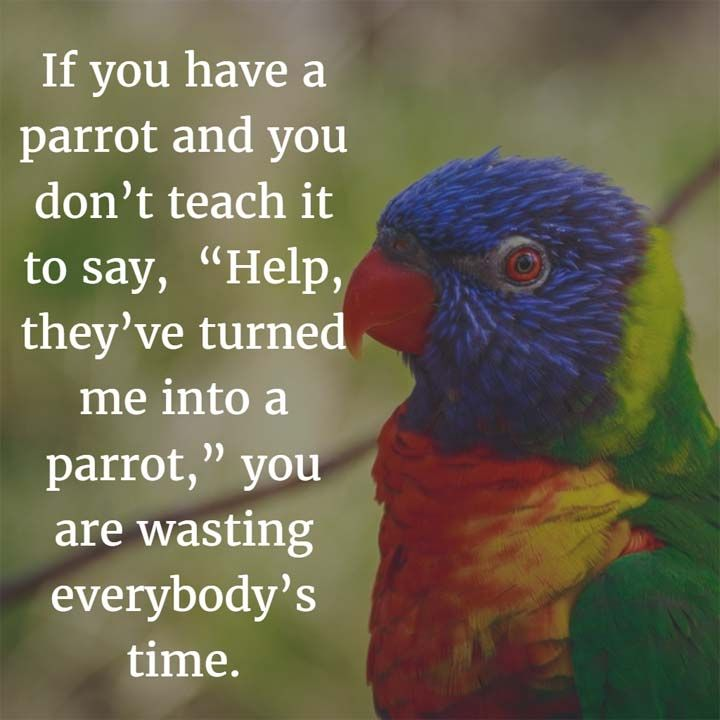

In [ ]:
train_img = cv2.imread('train.jpg')
show_image("Original image", train_img)

# Orb detector

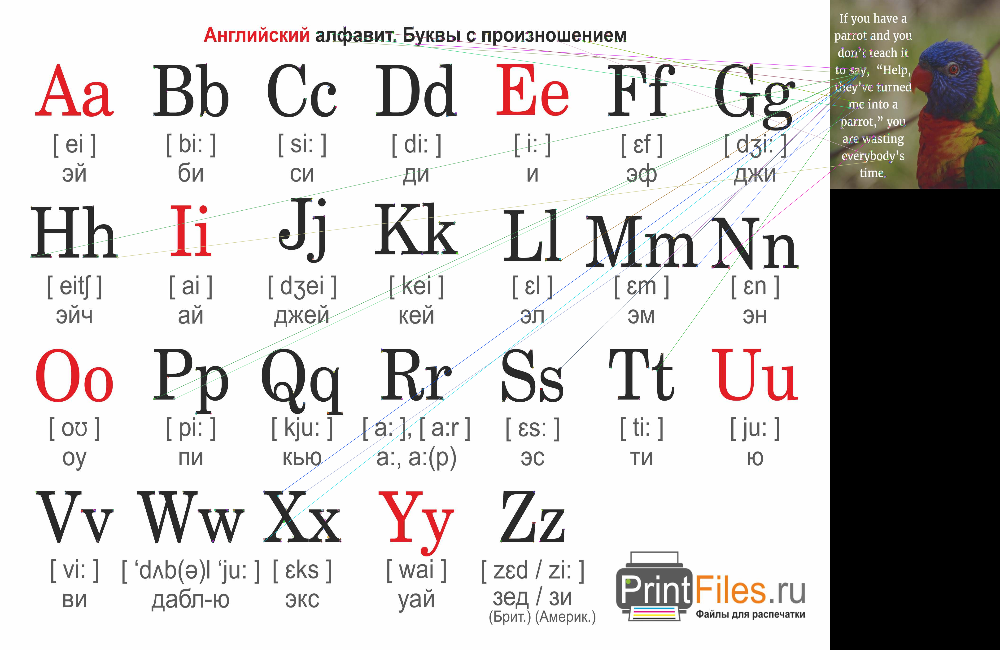

In [ ]:

query_img = cv2.imread('query.jpg')
train_img = cv2.imread('train.jpg')

orb_detector(query_img, train_img)

# Transform image

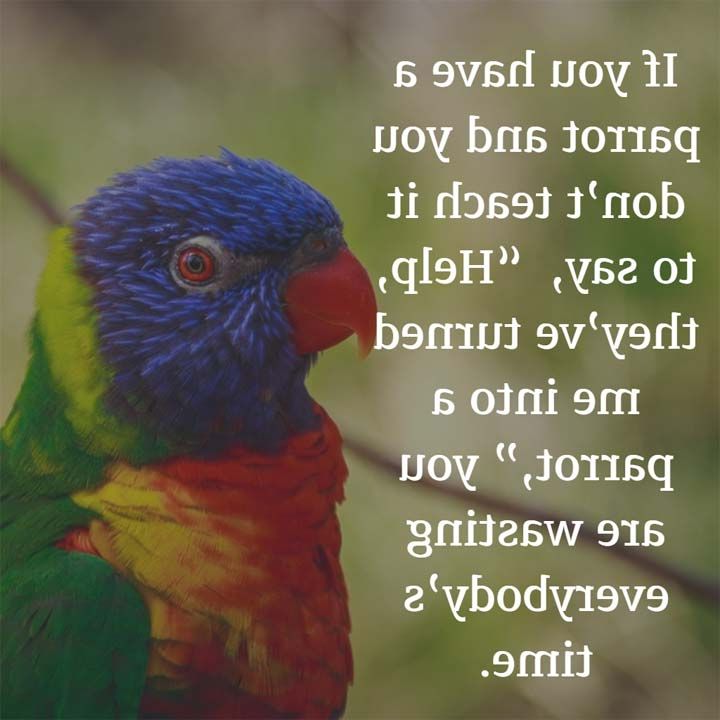

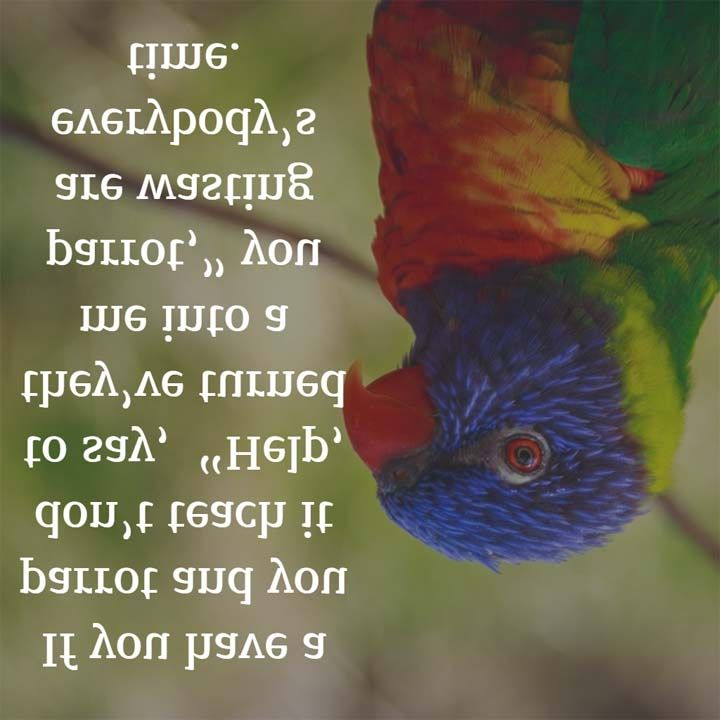

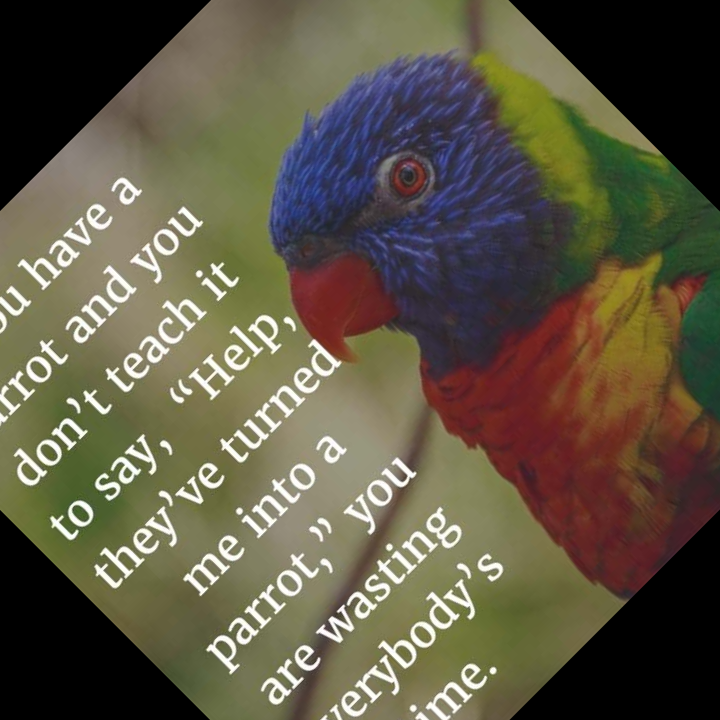

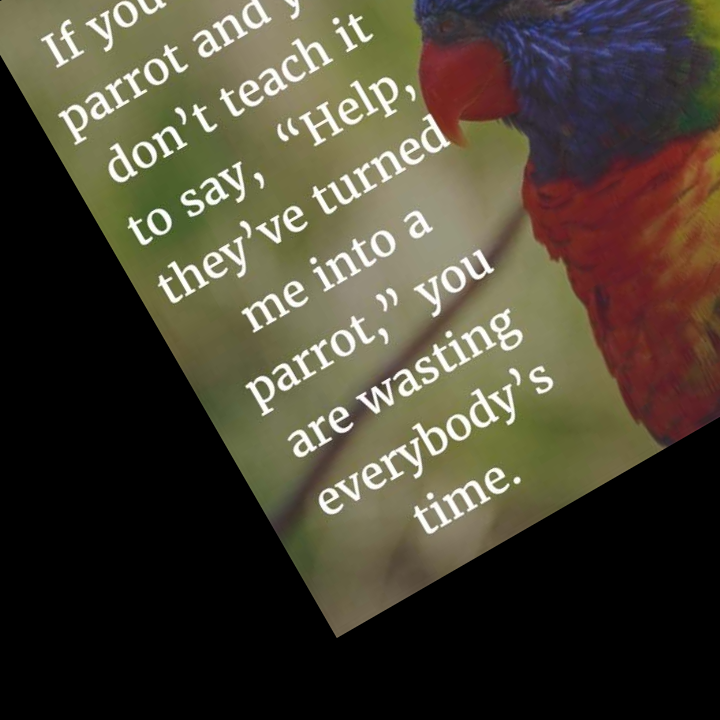

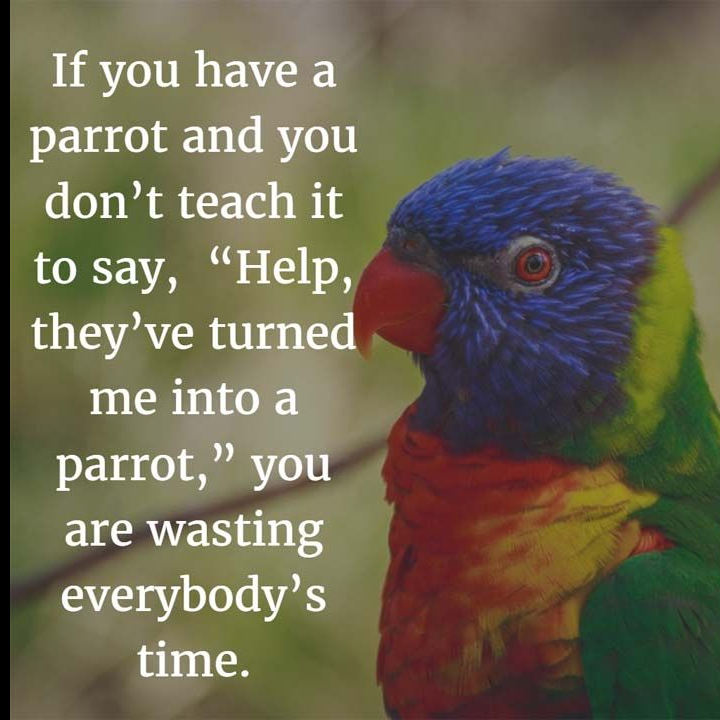

In [ ]:
train_img = cv2.imread('train.jpg')
flip_horizontally(train_img)
flip_vertically(train_img)
rotate_45(train_img)
rotate_30(train_img, (30, 100))
translate(train_img)

# Fourier methods

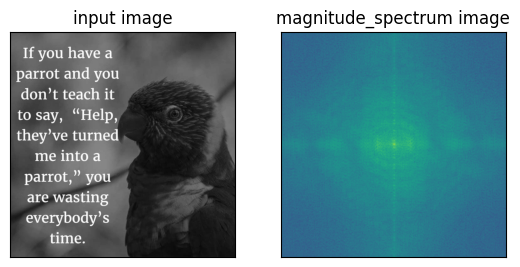

(720, 720, 2)
(720, 720, 2)


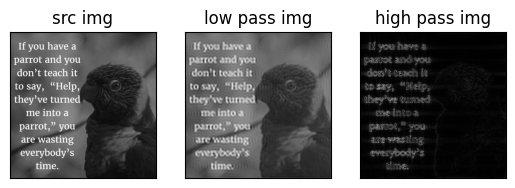

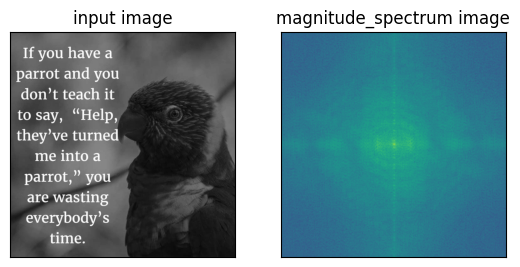

(720, 720, 2)
(720, 720, 2)


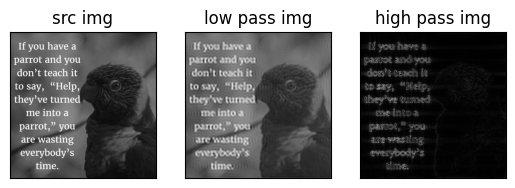

In [ ]:
train_img = cv2.imread('train.jpg')
fourier(train_img, 0)
fourier(train_img, 1)

# Brightness and contrast

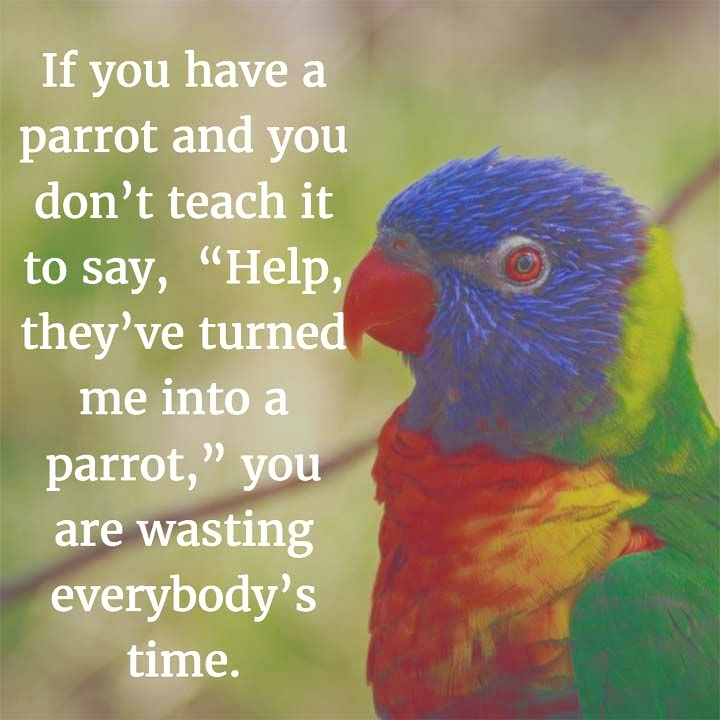

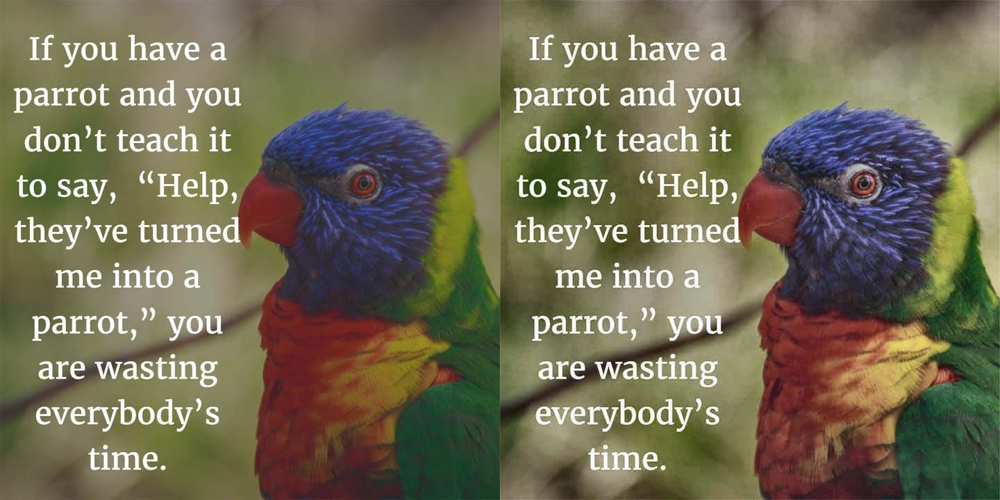

In [ ]:
train_img = cv2.imread('train.jpg')
increase_brightness(train_img)
adjust_contrast_brightness(train_img)

# Sift method

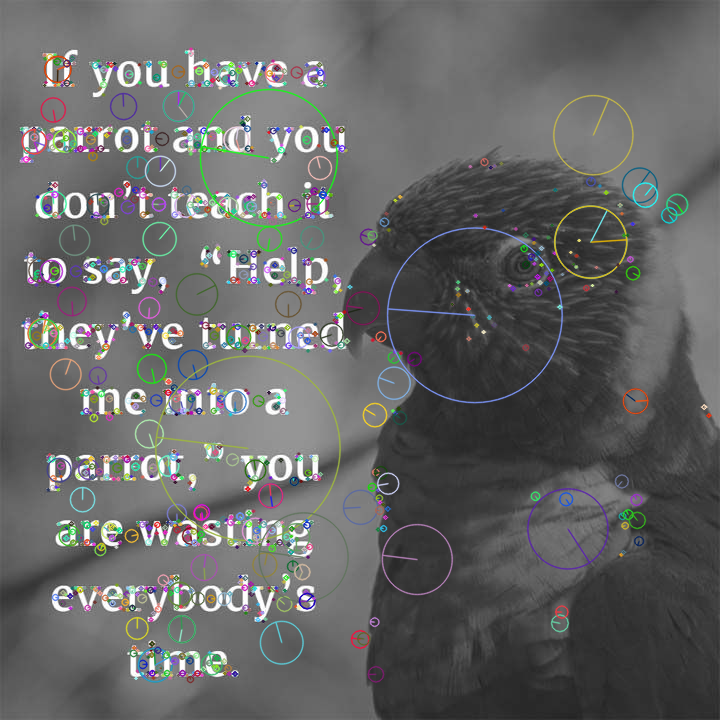

In [ ]:
train_img = cv2.imread('train.jpg')
sift(train_img)

# Canny edge detector

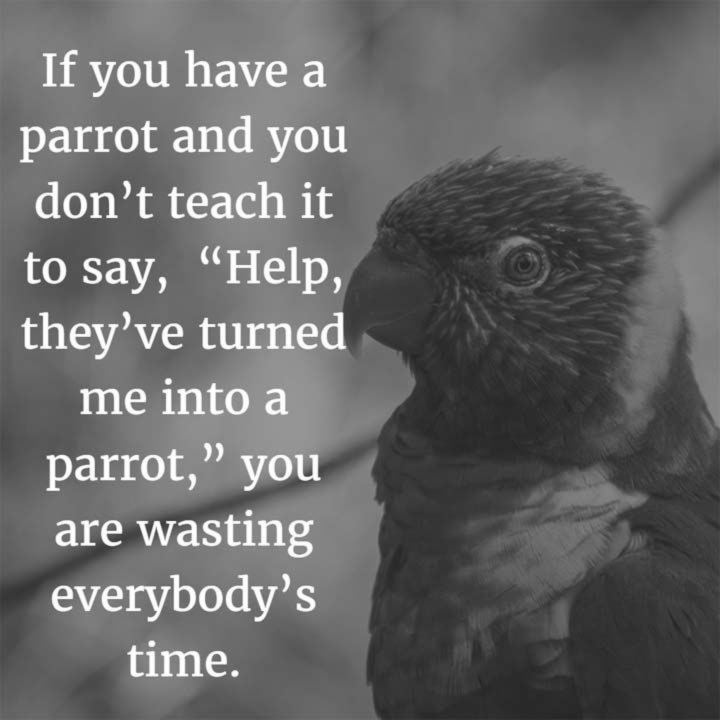

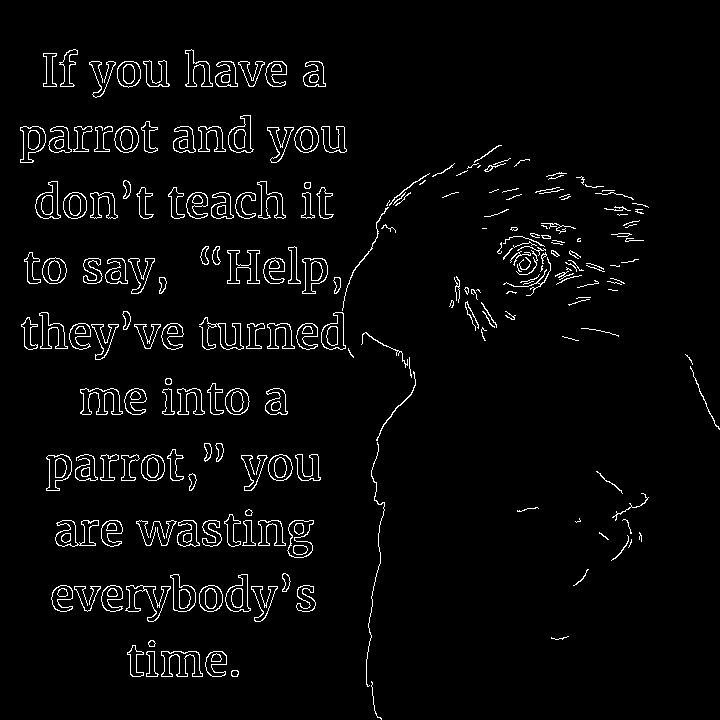

(array([[117, 116, 115, ..., 104, 107, 110],
        [116, 115, 114, ..., 101, 105, 107],
        [115, 115, 114, ...,  99, 102, 105],
        ...,
        [104, 101,  98, ...,  42,  46,  53],
        [106, 104, 101, ...,  46,  51,  57],
        [109, 106, 104, ...,  52,  56,  63]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8))

In [ ]:
train_img = cv2.imread('train.jpg')
canny_edge_detection(train_img)

# Grayscale and HSV

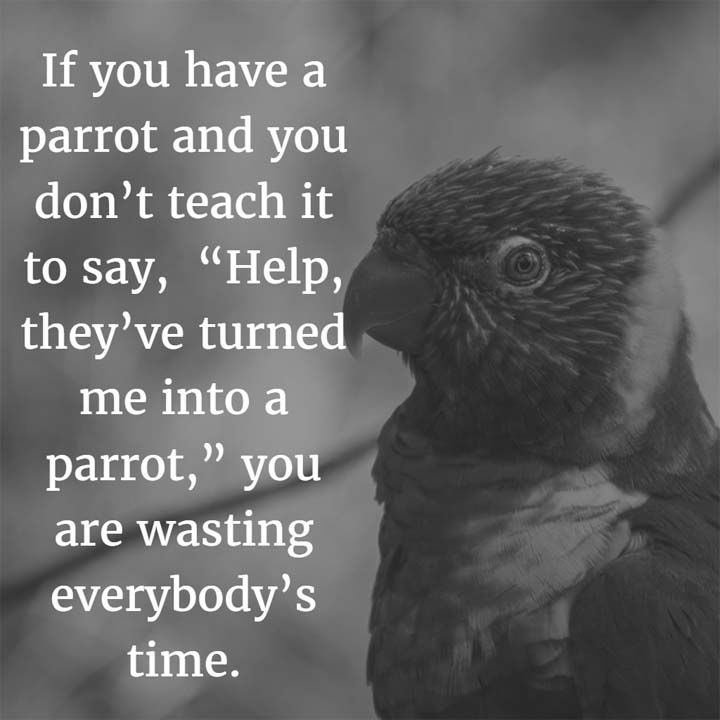

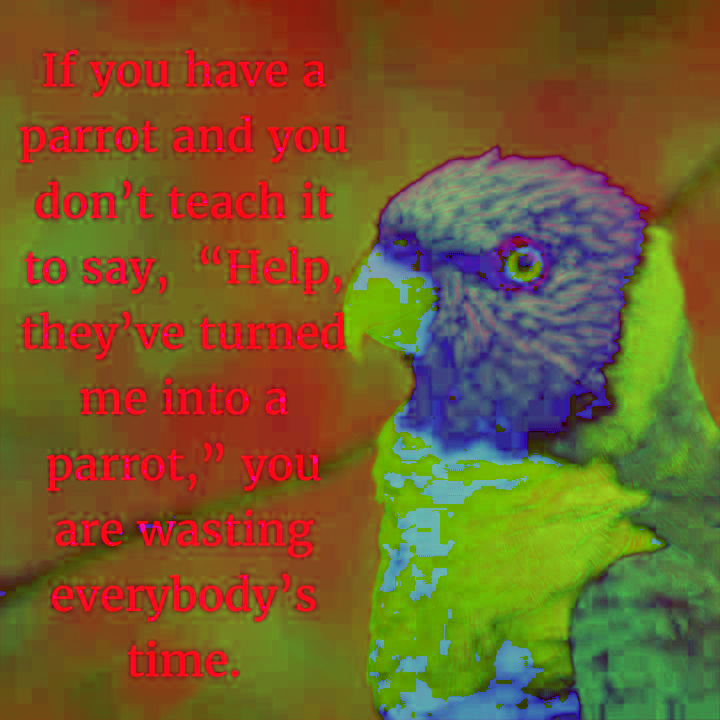

In [ ]:
train_img = cv2.imread('train.jpg')
grayscale(train_img)
hsv(train_img)

# Gamma correction and hist equalization

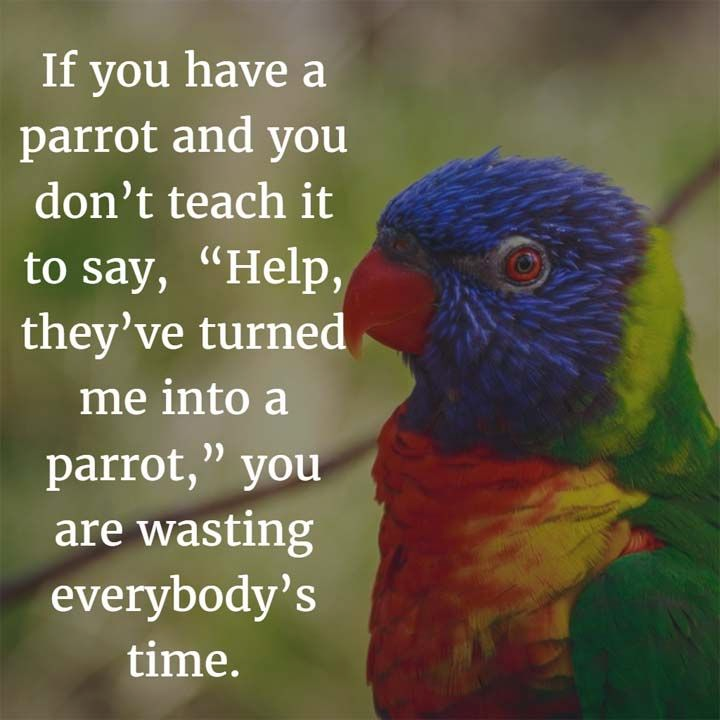

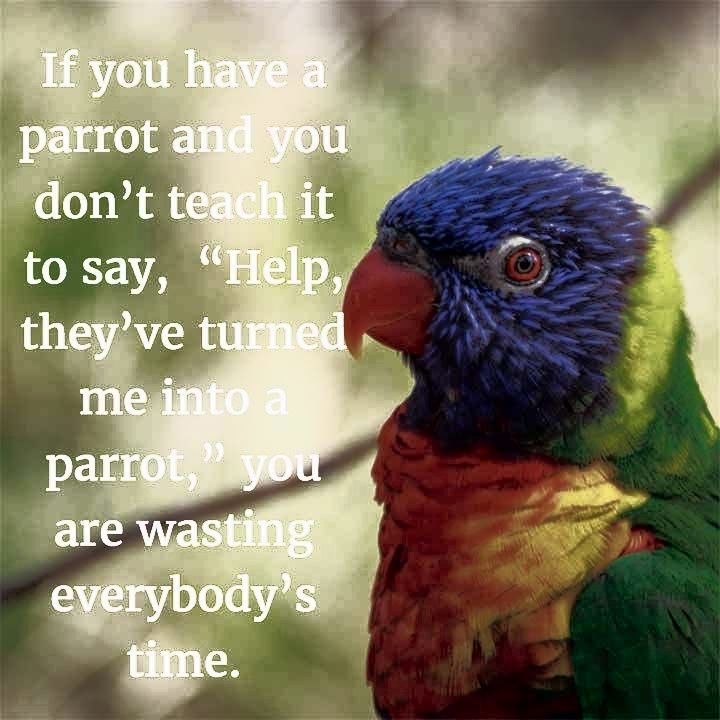

In [ ]:
train_img = cv2.imread('train.jpg')
gamma_correction(train_img)
hist_equalization(train_img)

# White balance

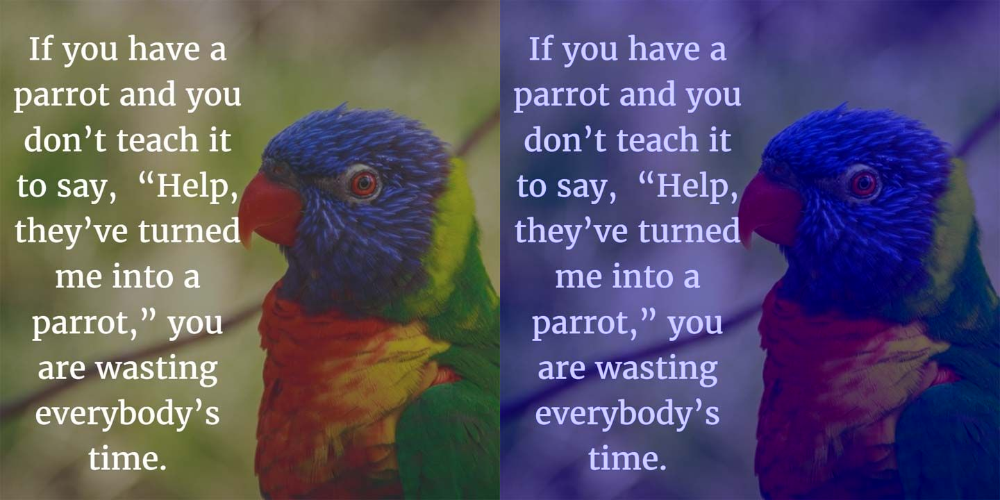

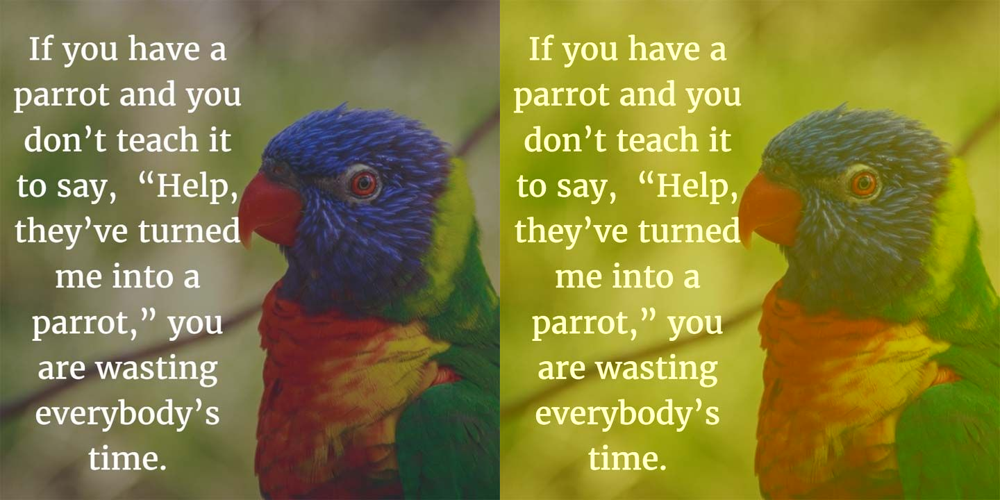

In [ ]:
train_img = cv2.imread('train.jpg')
white_balance(train_img, -90, "Colder")
white_balance(train_img, 90, "Warmer")

# Change color palette from while to black

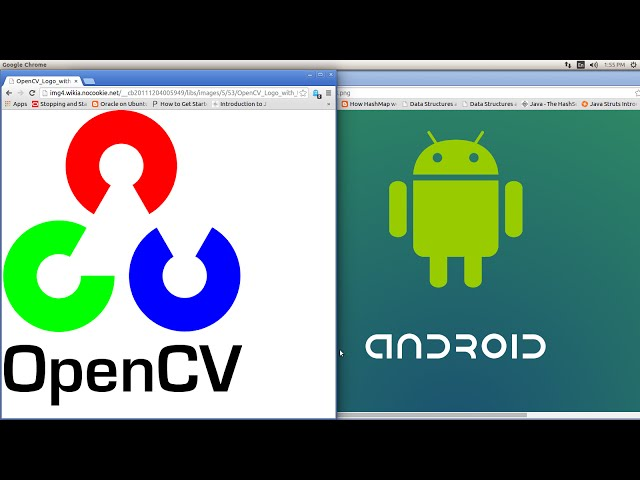

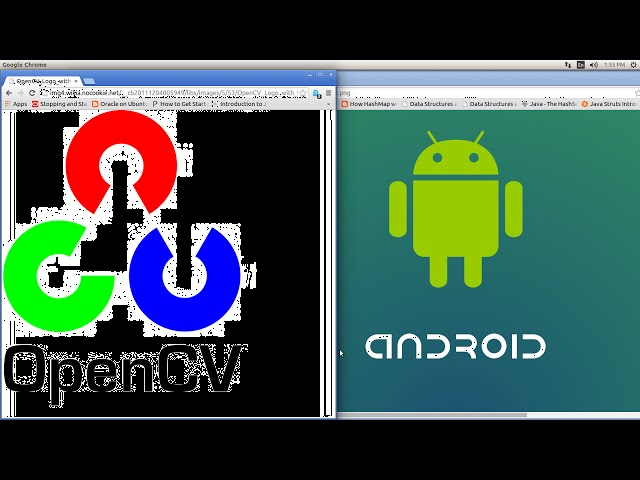

In [ ]:
train_img = cv2.imread('train1.jpg')
show_image("Original image", train_img)
color_palette(train_img, white, black)

# Binarize image and find contours

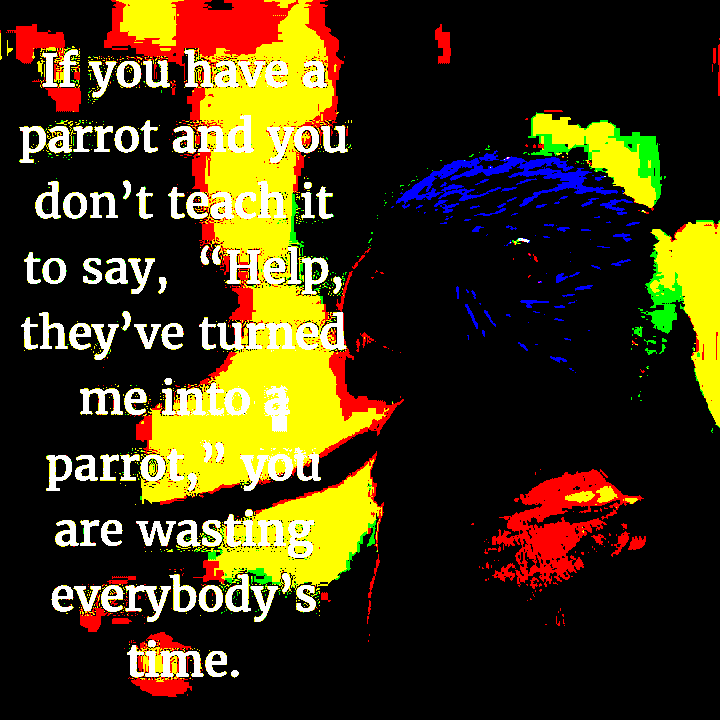

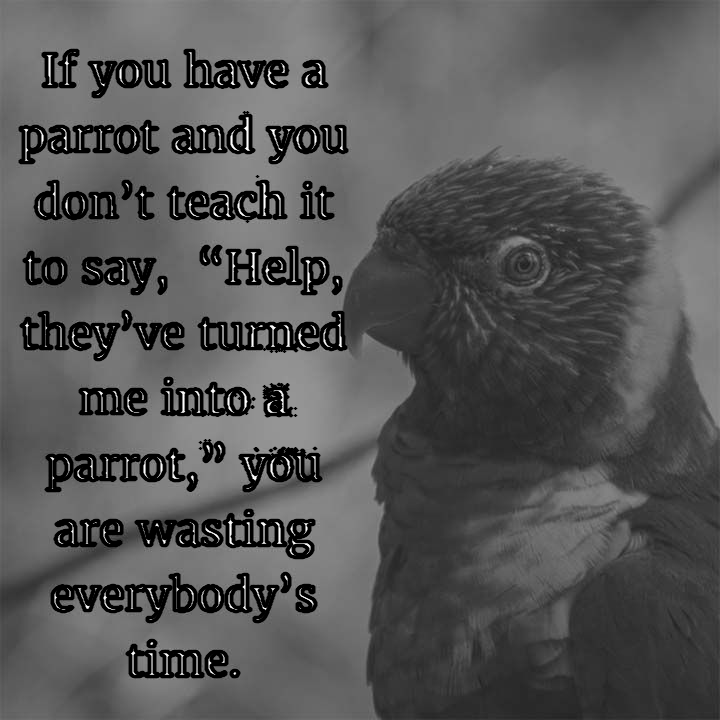

In [ ]:
train_img = cv2.imread('train.jpg')
binarize_image(train_img)
binarize_contours(train_img)

# Apply laplasian

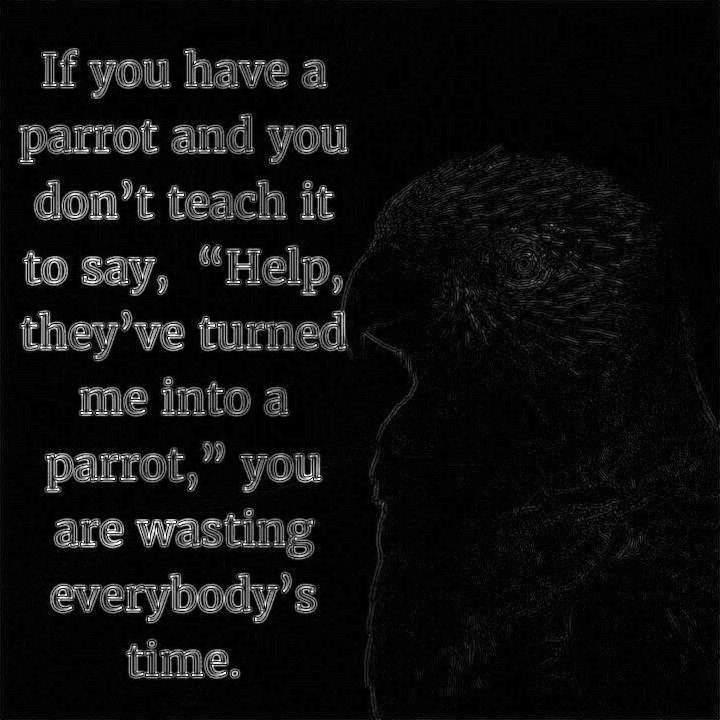

In [ ]:
train_img = cv2.imread('train.jpg')
laplasian(train_img)

# Smooth image

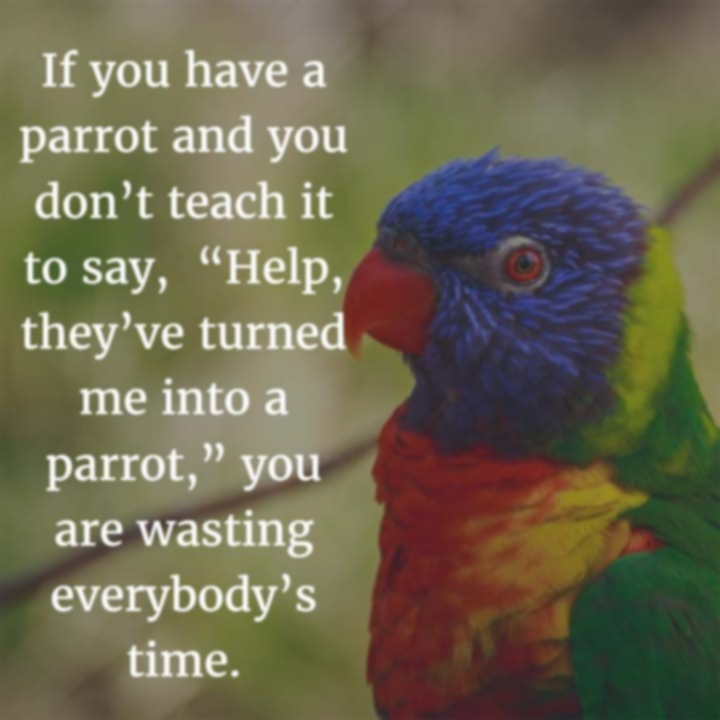

In [ ]:
train_img = cv2.imread('train.jpg')
smoothing_image(train_img)

# Erosion and dilation

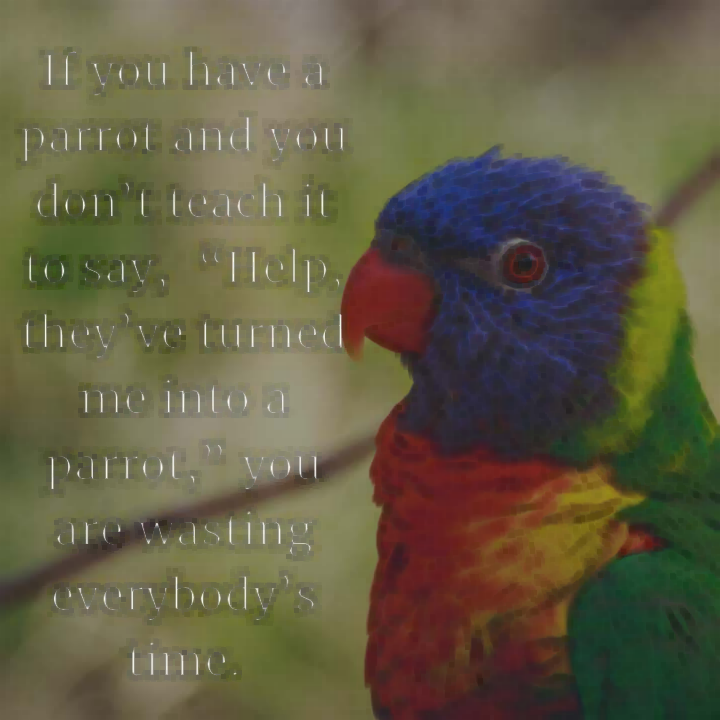

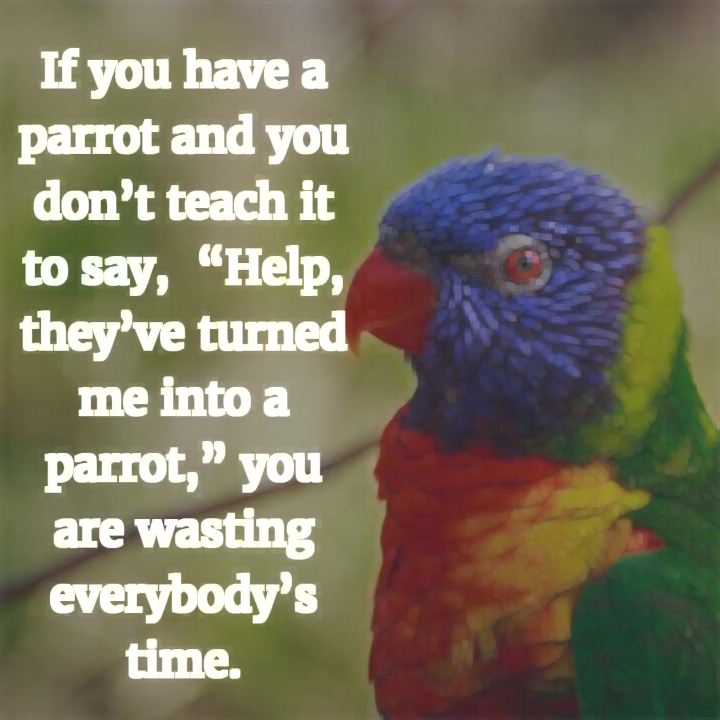

In [ ]:
train_img = cv2.imread('train.jpg')
erosion(train_img)
dilation(train_img)